In [1]:
import sys
from pathlib import Path
parent_dir = Path.cwd().parent
sys.path.append(str(parent_dir))

from PIL import Image
import sys
from pathlib import Path
from PIL import Image
import torch
import numpy as np
from molmo_utils import load_model, do_inference, get_coordinates, calculate_probability_of_coordinates
from utils import extract_all, plot_scatter, calculate_normalized_euclidian_distance, visualize_points_on_image, calculate_spread, cluster_data, show_cluster

2025-02-09 11:27:26.745175: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-09 11:27:26.983470: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-09 11:27:26.983513: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-09 11:27:26.983554: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-09 11:27:27.002210: I tensorflow/core/platform/cpu_feature_g

In [2]:
model_name = 'allenai/Molmo-7B-D-0924'
model, processor = load_model(model_name)

Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

In [33]:
import numpy as np

from sklearn import metrics
from sklearn.cluster import DBSCAN

db = DBSCAN(eps=0.3, min_samples=10).fit(X)
labels = db.labels_
print(labels)

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

[ 0  1  0  2  0  1  1  2  0  0  1  1  1  2  1  0 -1  1  1  2  2  2  2  2
  1  1  2  0  0  2  0  1  1  0  1  0  2  0  0  2  2  1  1  1  1  1  0  2
  0  1  2  2  1  1  2  2  1  0  2  1  2  2  2  2  2  0  2  2  0  0  0  2
  0  0  2  1 -1  1  0  2  1  1  0  0  0  0  1  2  1  2  2  0  1  0  1 -1
  1  1  0  0  2  1  2  0  2  2  2  2 -1  0 -1  1  1  1  1  0  0  1  0  1
  2  1  0  0  1  2  1  0  0  2  0  2  2  2  0 -1  2  2  0  1  0  2  0  0
  2  2 -1  2  1 -1  2  1  1  2  2  2  0  1  0  1  0  1  0  2  2 -1  1  2
  2  1  0  1  2  2  2  1  1  2  2  0  1  2  0  0  2  0  0  1  0  1  0  1
  1  2  2  0  0  1  1  2  1  2  2  2  2  0  2  0  2  2  0  2  2  2  0  0
  1  1  1  2  2  2  2  1  2  2  0  0  2  0  0  0  1  0  1  1  1  2  1  1
  0  1  2  2  1  2  2  1  0  0  1  1  1  0  1  0  2  0  2  2  2  2  2  1
  1  0  0  1  1  0  0  2  1 -1  2  1  1  2  1  2  0  2  2  0  1  2  2  0
  2  2  0  0  2  0  2  0  2  1  0  0  0  1  2  1  2  2  0  2  2  0  0  2
  1  1  1  1  1  0  1  1  1  1  0  0  1  1  1  0  2

In [34]:
def cluster_data(coordinates, epsilon=10, min_samples=3):
    coordinates = np.array(coordinates)
    db = DBSCAN(eps=epsilon, min_samples=min_samples).fit(coordinates)
    labels = db.labels_

    # Calculate number of clusters and noisy points
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

    if (n_clusters == 0):
        print("Didnt find any cluster")
        return n_clusters, _, _, _, _
    else:
        n_noise = list(labels).count(-1)
        
    
        # Calculate majority_cluster
        unique_labels, counts = np.unique(labels[labels != -1], return_counts=True)
        majority_label = unique_labels[np.argmax(counts)]
        majority_cluster_points = coordinates[labels == majority_label]
        noisy_majority_points = coordinates[labels == -1]
        centroid = np.mean(majority_cluster_points, axis=0)
        diameter = np.max(pdist(majority_cluster_points)) if len(majority_cluster_points) > 1 else 0
    
        # Print results
        print(f"Number of clusters: {n_clusters}")
        print(f"Number of noisy points: {n_noise}")
        print(f"Majority cluster label: {majority_label}")
        print(f"Centroid of majority cluster: {centroid}")
        print(f"Diameter of majority cluster: {diameter}") 

        return n_clusters, majority_cluster_points, noisy_majority_points, centroid, diameter

In [40]:
def show_cluster(image, majority_cluster_points, noisy_majority_points, centroid, diameter):  
    plt.imshow(image, alpha=1)

    # Plot majority cluster points
    plt.scatter(majority_cluster_points[:, 0], majority_cluster_points[:, 1], c='blue', label='Majority Cluster')

    # Plot noisy points 
    plt.scatter(noisy_majority_points[:, 0], noisy_majority_points[:, 1], c='black', label='Noise', alpha=0.6)
   
    # Plot centroid
    plt.scatter(centroid[0], centroid[1], c='red', marker='x', label='Centroid')

    # Draw cluster boundary
    circle = plt.Circle(centroid, diameter / 2, color='blue', fill=False, linestyle='dashed', linewidth=1)
    plt.gca().add_patch(circle)

    plt.legend()
    plt.show()
    plt.close()


In [30]:
n_clusters, majority_label, majority_points, centroid, diameter, n_noise = cluster_data(X)
show_cluster(X, majority_label, majority_points, centroid, diameter)

0
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 

ValueError: not enough values to unpack (expected 6, got 5)

In [3]:
def run_experiment(path_to_experiments, prompt_starts, prompt_ends, runs_per_task, temperature, epsilon, min_samples):
    tasks, images, ground_truths, objects = extract_all(path_to_experiments)
    softmax_fn = torch.nn.Softmax(dim=-1)
    labels = []

    x_what = []
    x_where = []
    x_all = []
    
    y_what = []
    y_where = []
    y_all = []
    
    for i in range(len(tasks)):
        task = tasks[i]
        labels.append(task)
        ground_truth = ground_truths[i]

        objects_of_task = objects[i]
        object = " The releveant object is: " + objects_of_task[0] + " "
        prompt_what = prompt_starts[0] + task + object + prompt_ends[0]
        prompt_where = prompt_starts[1] + task + object + prompt_ends[1]
    
        #norm_dist_what = []
        #norm_dist_where = []

        coord_what = []
        coord_where = []

        print(f"{task}")
        with Image.open(images[i]) as image:
            image_width = image.width
            image_height = image.height
    
            prompts = [prompt_what]
            if (len(ground_truth) == 2):
                prompts.append(prompt_where)
                labels.append(task)
    
            for k in range(len(prompts)):
                for j in range(runs_per_task):
                    output_text, output, inputs = do_inference(image, prompts[k], model, processor, temperature)
                    
                    coordinates = get_coordinates(output_text, image_width, image_height)
                    if len(coordinates) == 1:
                        #norm_dist = calculate_normalized_euclidian_distance(coordinates[0], ground_truth[k], image_width, image_height)

                        if (k == 0):
                            #norm_dist_what.append(norm_dist)
                            coord_what += coordinates
                        else:
                            #norm_dist_where.append(norm_dist)
                            coord_where += coordinates
            
            if (len(coord_where) != 0):
                visualize_points_on_image(image, ["Object to move", "Where to place"], [coord_what, coord_where])
            else:
                visualize_points_on_image(image, ["Object to move"], [coord_what])

                
            n_clusters, majority_points, noisy_points, centroid, diameter = cluster_data(coord_what, epsilon=epsilon, min_samples=min_samples)
            if (n_clusters != 0):
                norm_dist = calculate_normalized_euclidian_distance(centroid, ground_truth[0], image_width, image_height)
                x_what.append(norm_dist)
                x_all.append(norm_dist)
                y_what.append(diameter)
                y_all.append(diameter)
                show_cluster(image, majority_points, noisy_points, centroid, diameter)

            if (len(ground_truth) == 2):
                n_clusters, majority_points, noisy_points, centroid, diameter = cluster_data(coord_where, epsilon=epsilon, min_samples=min_samples)
                if (n_clusters != 0):
                    norm_dist = calculate_normalized_euclidian_distance(centroid, ground_truth[1], image_width, image_height)
                    x_where.append(norm_dist)
                    x_all.append(norm_dist)
                    y_where.append(diameter)
                    y_all.append(diameter)
                    show_cluster(image, majority_points, noisy_points, centroid, diameter)
        
    plot_scatter(labels, y_all, x_all, "Scatterplot of majority clusters per task", "Normalized distance of majority cluster to gt", "Diameter of the cluster")
    plot_scatter(["Object to move", "Where to place"], [y_what, y_where], [x_what, x_where], "Scatterplot of majority clusters for the two objectives",  "Normalized distance of majority cluster to gt", "Diameter of the cluster")

pull the oven tray


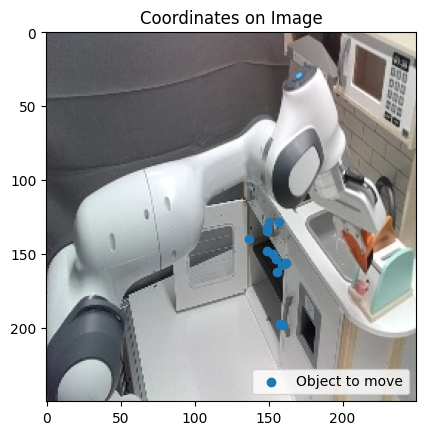

Number of clusters: 1
Number of noisy points: 3
Majority cluster label: 0
Centroid of majority cluster: [153.08333333 145.33333333]
Diameter of majority cluster: 34.52535300326414


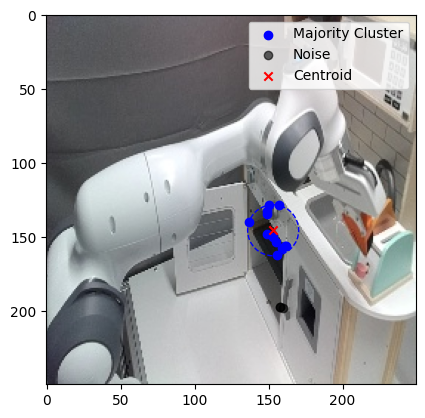

move the fruit from the left stove to the sink


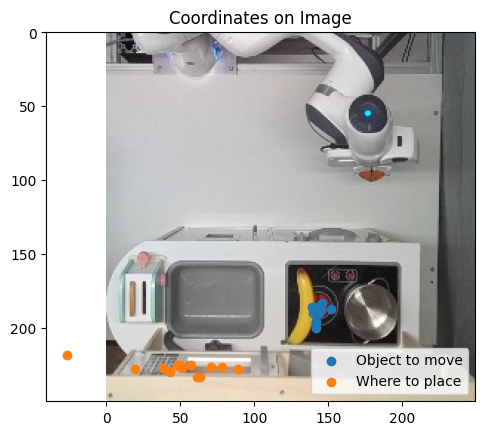

Number of clusters: 1
Number of noisy points: 0
Majority cluster label: 0
Centroid of majority cluster: [143.  188.8]
Diameter of majority cluster: 17.46424919657298


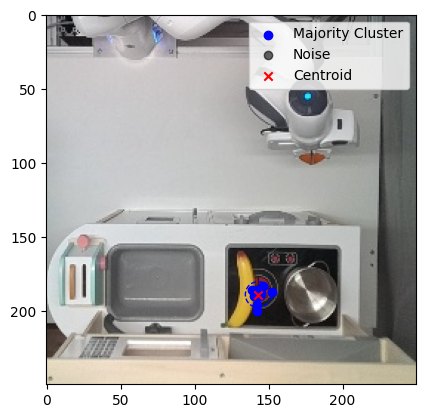

Number of clusters: 1
Number of noisy points: 3
Majority cluster label: 0
Centroid of majority cluster: [ 55.08333333 227.41666667]
Diameter of majority cluster: 40.01249804748511


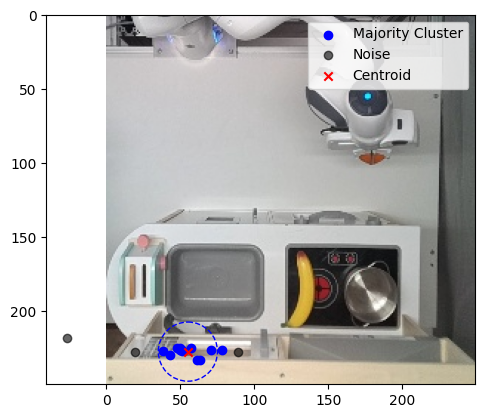

open low fridge


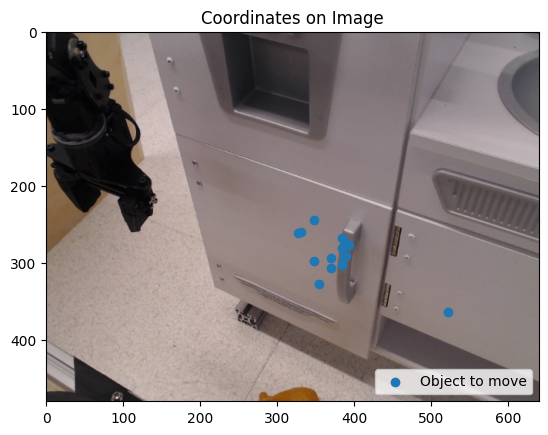

Number of clusters: 1
Number of noisy points: 8
Majority cluster label: 0
Centroid of majority cluster: [386.85714286 283.        ]
Diameter of majority cluster: 34.0


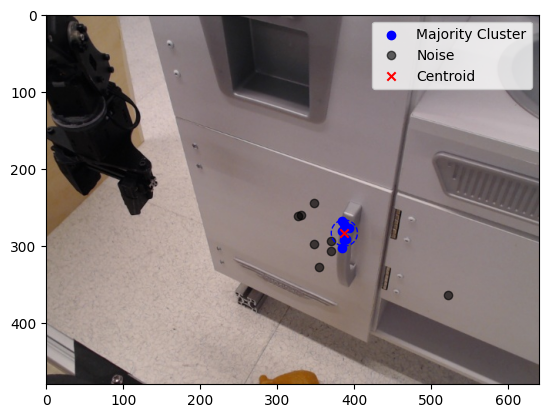

open the drawer


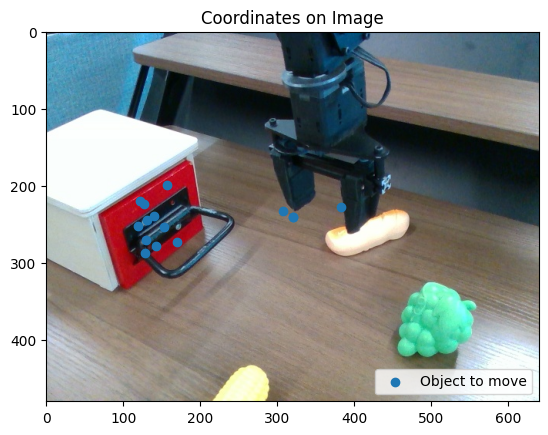

Didnt find any cluster
Move the can from the top left of the burner to the bottom left of the burner


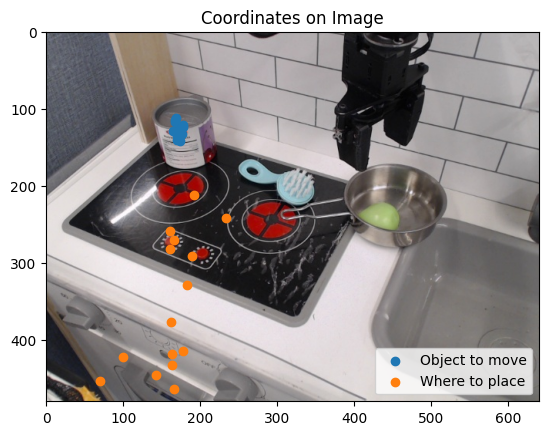

Number of clusters: 1
Number of noisy points: 0
Majority cluster label: 0
Centroid of majority cluster: [171.2        127.53333333]
Diameter of majority cluster: 30.4138126514911


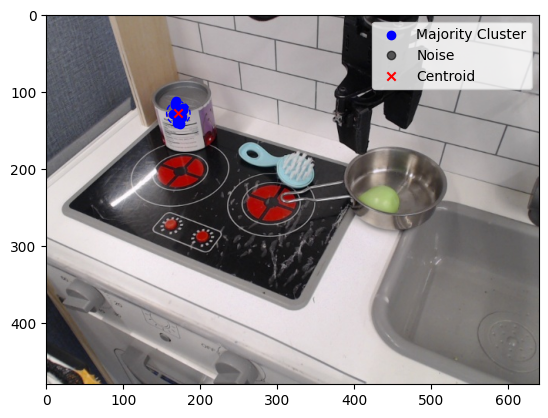

Didnt find any cluster
Place the pot to the right of the blue fork.


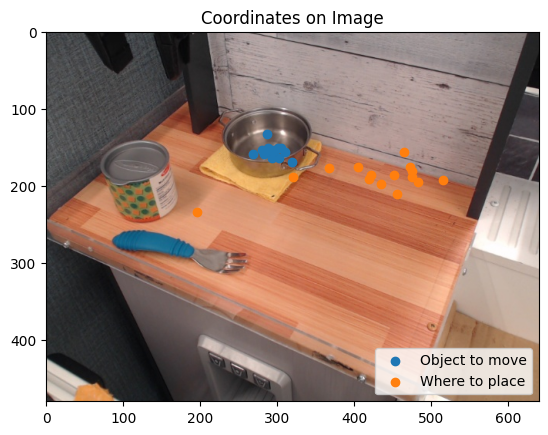

Number of clusters: 1
Number of noisy points: 2
Majority cluster label: 0
Centroid of majority cluster: [292.69230769 155.69230769]
Diameter of majority cluster: 42.1070065428546


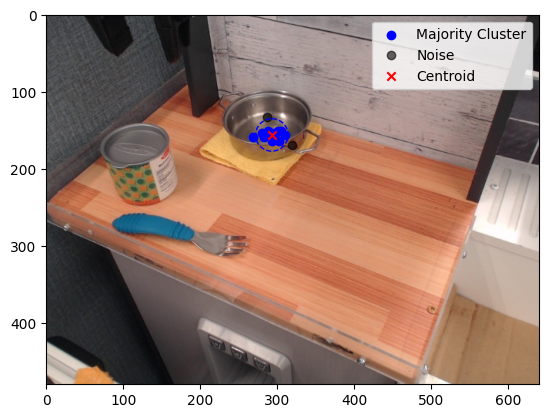

Number of clusters: 1
Number of noisy points: 11
Majority cluster label: 0
Centroid of majority cluster: [476.25 184.75]
Diameter of majority cluster: 22.825424421026653


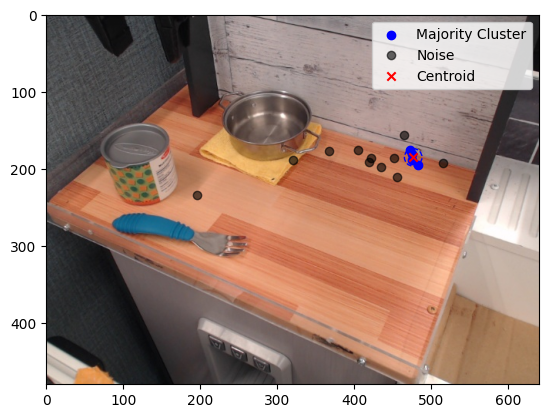

move the pot from the right to the left stove


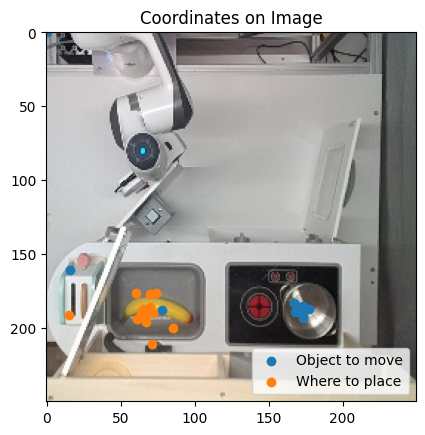

Number of clusters: 1
Number of noisy points: 3
Majority cluster label: 0
Centroid of majority cluster: [171.25       187.83333333]
Diameter of majority cluster: 11.661903789690601


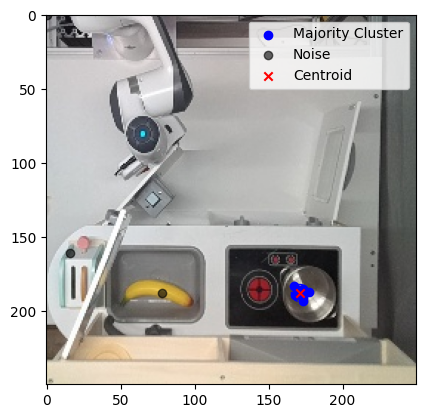

Number of clusters: 1
Number of noisy points: 3
Majority cluster label: 0
Centroid of majority cluster: [ 67.         187.08333333]
Diameter of majority cluster: 22.20360331117452


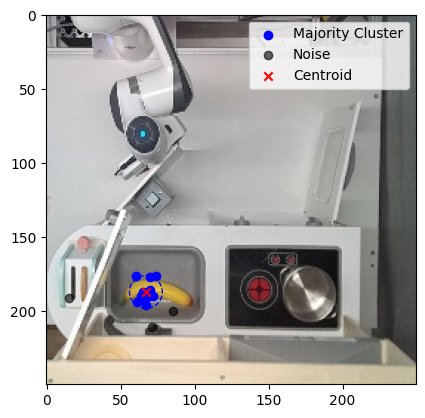

put potato in pot or pan


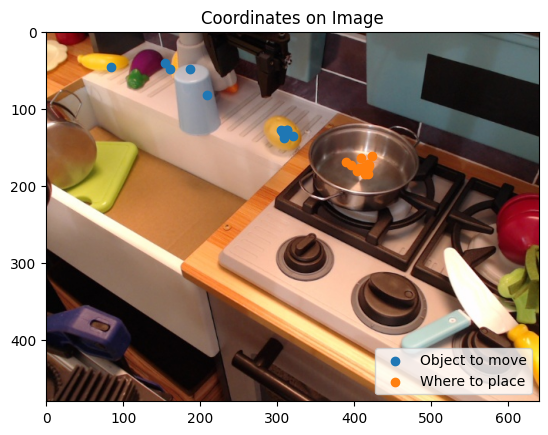

Number of clusters: 1
Number of noisy points: 5
Majority cluster label: 0
Centroid of majority cluster: [309.9 130.3]
Diameter of majority cluster: 17.88854381999832


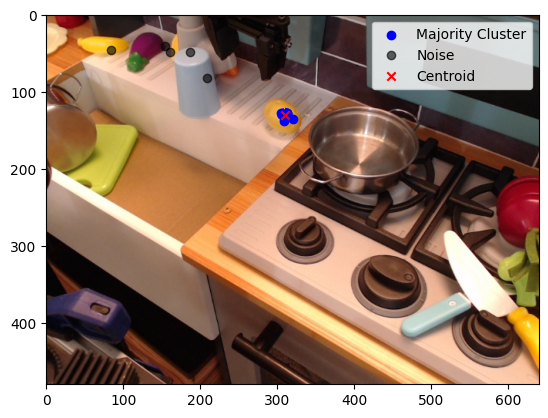

Number of clusters: 1
Number of noisy points: 0
Majority cluster label: 0
Centroid of majority cluster: [410.46666667 175.        ]
Diameter of majority cluster: 34.92849839314596


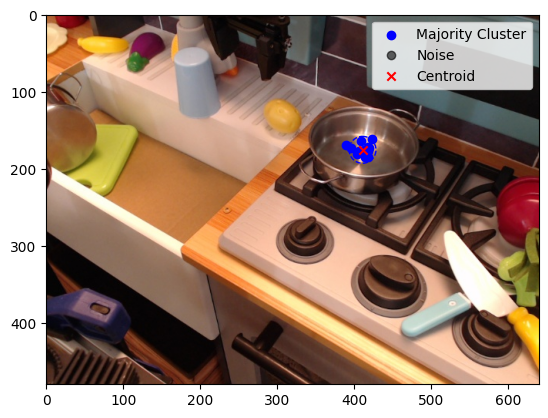

take cucumber out of cup


In [ ]:
experiment_path = "../data/base_experiments"
num_runs = 15
temperature = 0.6

epsilon = 15
min_samples = 4

prompt_starts = ["You are the robot in the picture. Your mission it to guide and support the user in its task to: ", "You are the robot in the picture. Your mission it to guide and support the user in its task to: "]
prompt_ends = [" For that you have to point to the relevant object in the picture. Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the object to move. Dont output anything else.", " For that you have to point to the place in the picture where the object has to be moved to. Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the place where the object has to be moved to. Dont output anything else."]

run_experiment(experiment_path, prompt_starts, prompt_ends, num_runs, temperature, epsilon, min_samples)

pull the oven tray


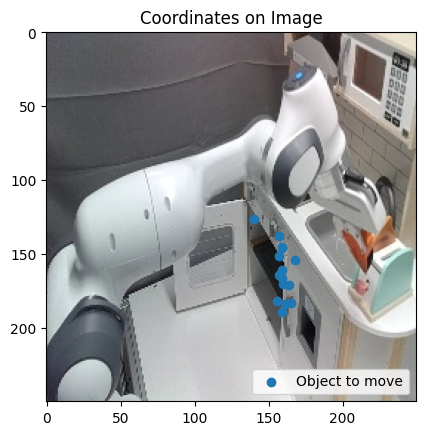

Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [160.         164.57142857]
Diameter of majority cluster: 51.03920062069938


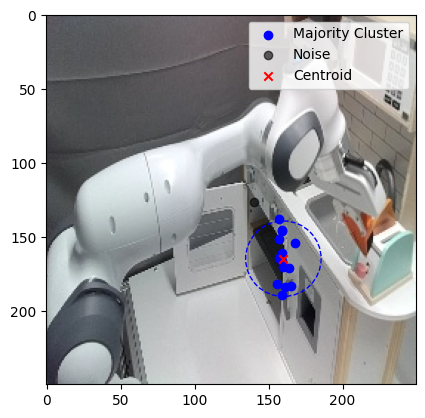

move the fruit from the left stove to the sink


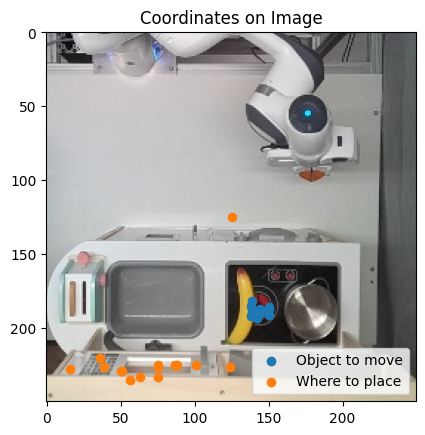

Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [142.66666667 188.93333333]
Diameter of majority cluster: 14.212670403551895


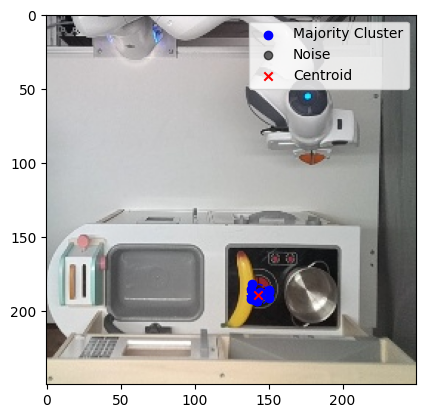

Number of clusters: 1
Number of noisy points: 3
Centroid of majority cluster: [ 66.33333333 227.58333333]
Diameter of majority cluster: 65.19202405202648


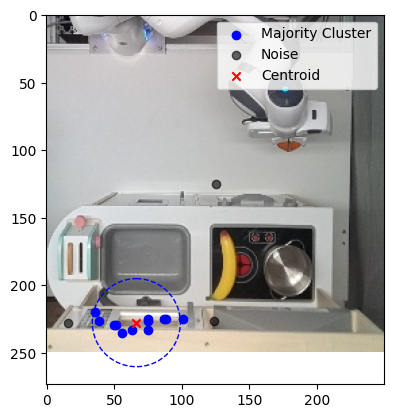

open low fridge


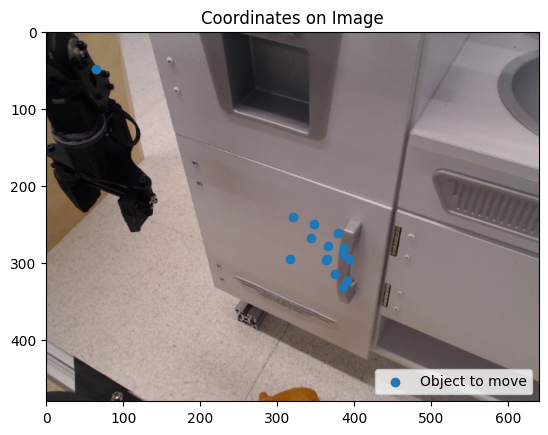

Didnt find any cluster
open the drawer


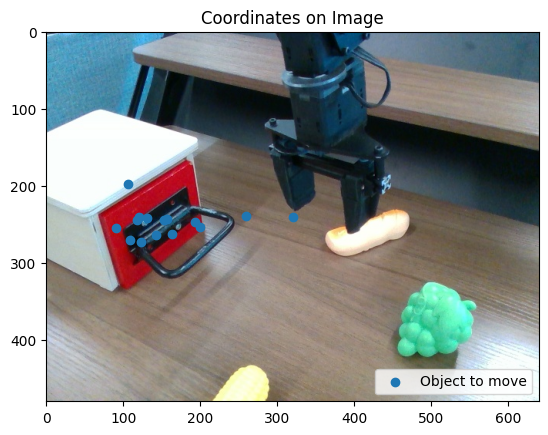

Didnt find any cluster
Move the can from the top left of the burner to the bottom left of the burner


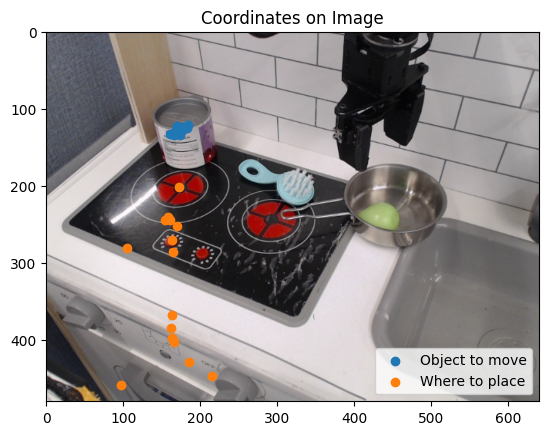

Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [172.53333333 126.8       ]
Diameter of majority cluster: 26.40075756488817


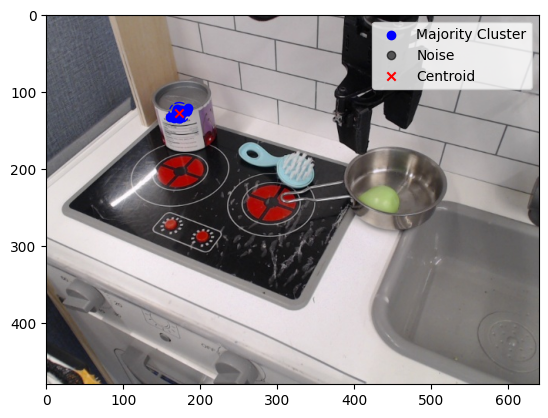

Didnt find any cluster
Place the pot to the right of the blue fork.


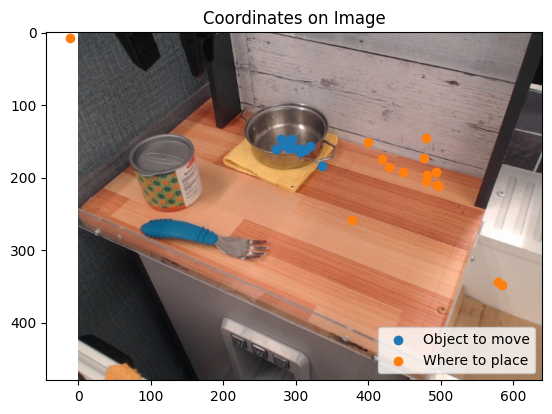

Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [294.5        155.71428571]
Diameter of majority cluster: 47.16990566028302


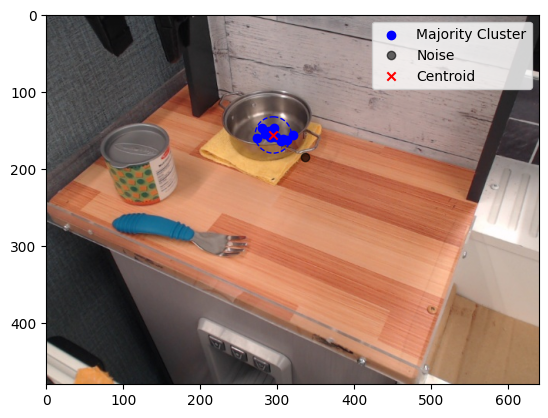

Didnt find any cluster
move the pot from the right to the left stove


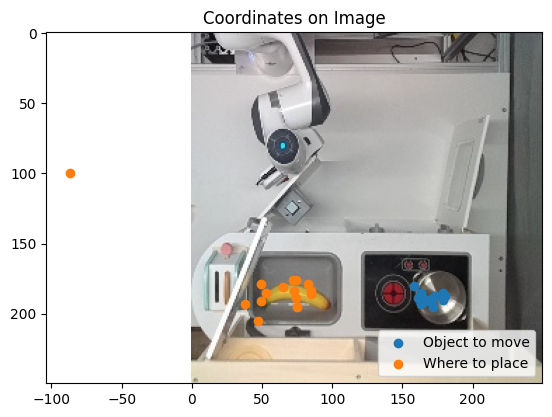

Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [169.93333333 188.46666667]
Diameter of majority cluster: 23.259406699226016


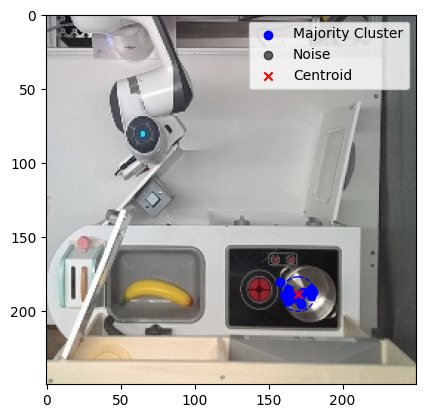

Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [ 65.85714286 185.92857143]
Diameter of majority cluster: 47.853944456021594


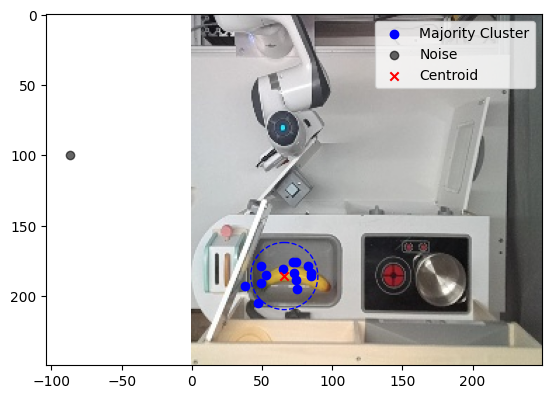

put potato in pot or pan


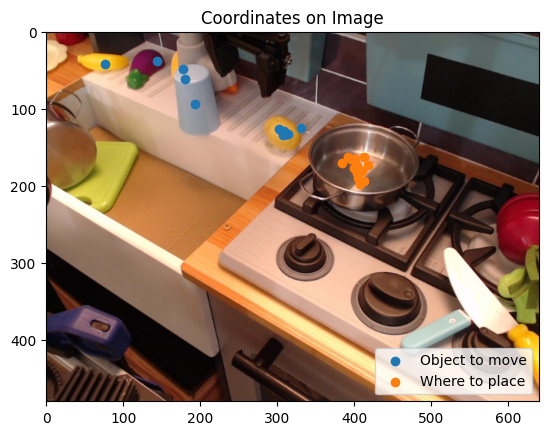

Number of clusters: 1
Number of noisy points: 6
Centroid of majority cluster: [308.22222222 131.        ]
Diameter of majority cluster: 13.416407864998739


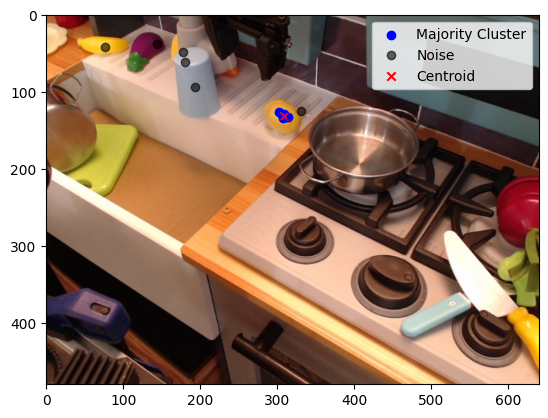

Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [402.86666667 175.86666667]
Diameter of majority cluster: 38.48376280978771


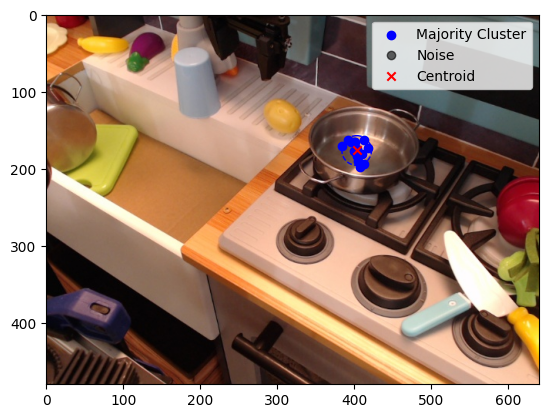

take cucumber out of cup


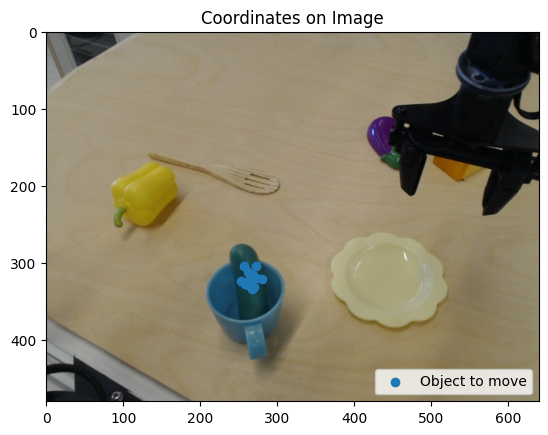

Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [265.4        320.26666667]
Diameter of majority cluster: 31.622776601683793


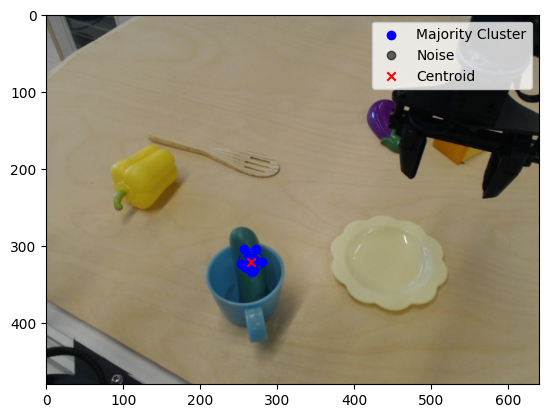

move the banana from the left stove to the sink


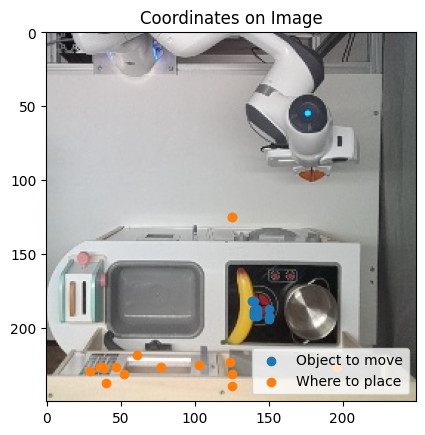

Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [142.6        188.86666667]
Diameter of majority cluster: 16.278820596099706


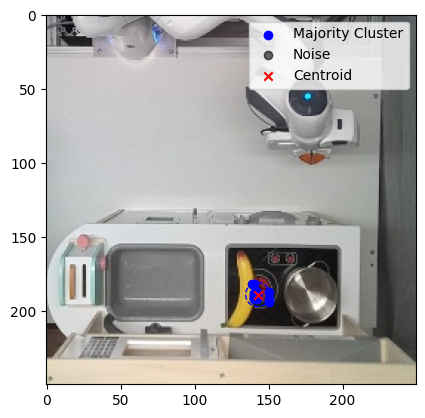

Number of clusters: 1
Number of noisy points: 8
Centroid of majority cluster: [ 43.42857143 227.71428571]
Diameter of majority cluster: 33.83784863137726


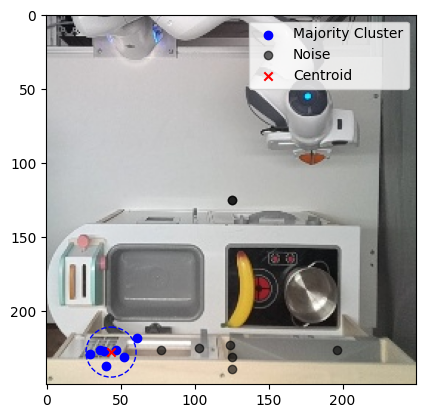

pick up the toast and put it to the sink


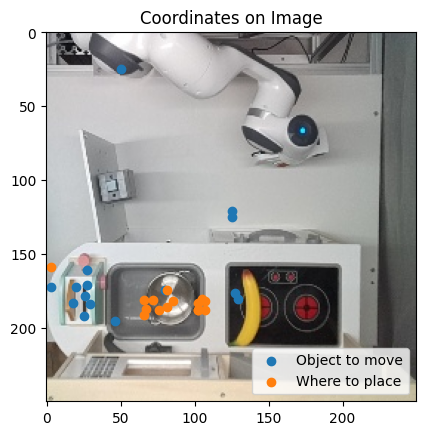

Number of clusters: 1
Number of noisy points: 7
Centroid of majority cluster: [ 21.875 176.625]
Diameter of majority cluster: 31.064449134018133


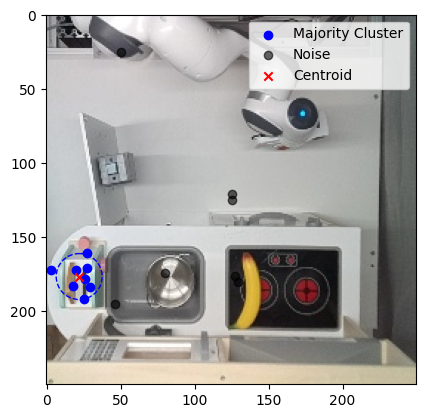

Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [ 87.07142857 184.21428571]
Diameter of majority cluster: 41.97618372363071


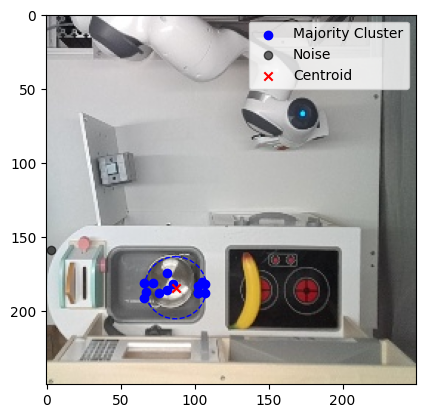

close the microwave


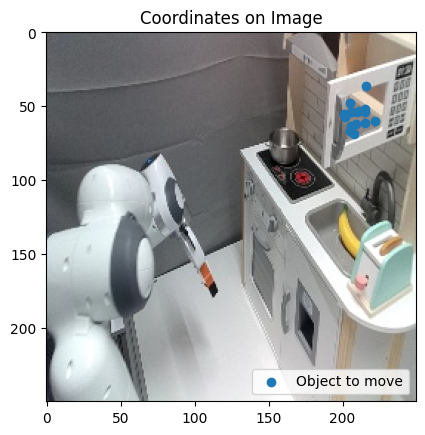

Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [209.73333333  56.33333333]
Diameter of majority cluster: 33.95585369269929


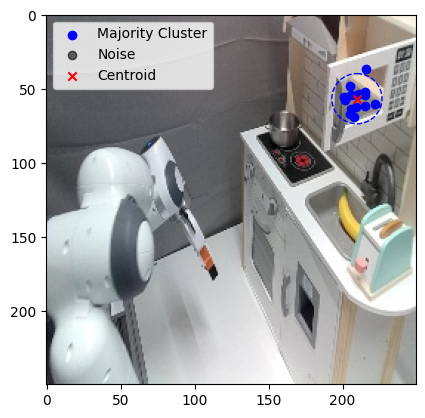

push the toaster lever


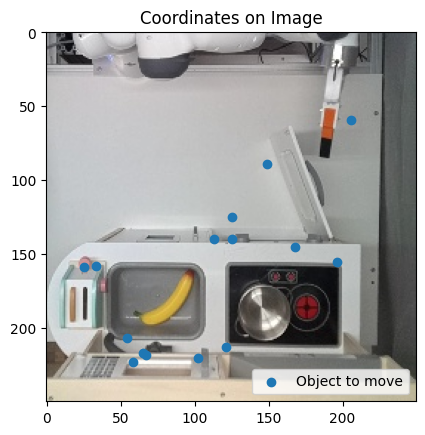

Didnt find any cluster
pick up glass cup


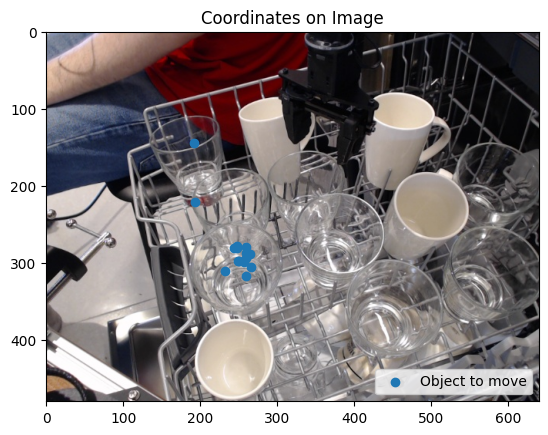

Number of clusters: 1
Number of noisy points: 3
Centroid of majority cluster: [255.         291.83333333]
Diameter of majority cluster: 40.80441152620633


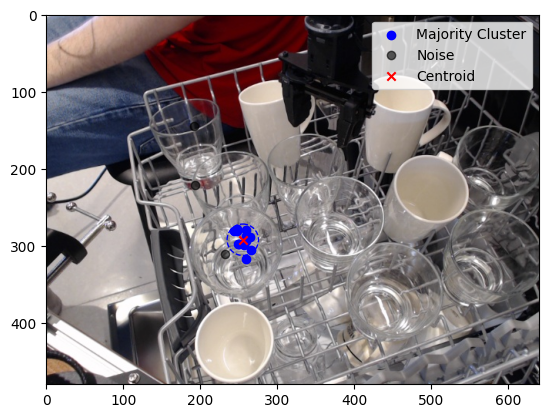

take the broccoli and put it between the two right burners


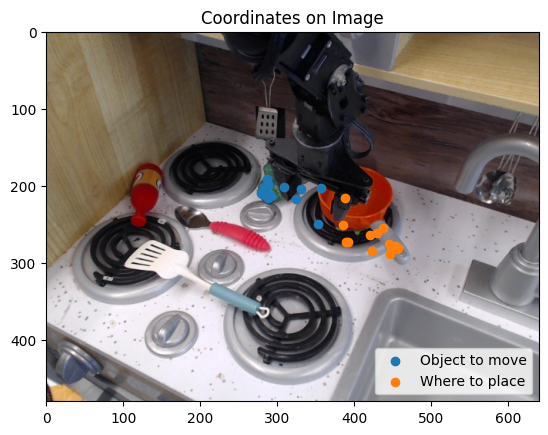

Number of clusters: 1
Number of noisy points: 5
Centroid of majority cluster: [285.3 204.6]
Diameter of majority cluster: 24.020824298928627


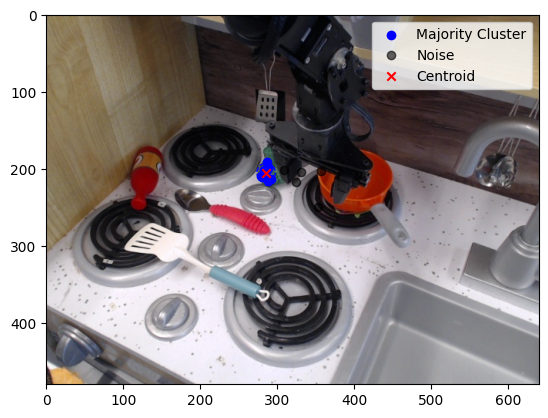

Number of clusters: 1
Number of noisy points: 8
Centroid of majority cluster: [450.28571429 280.85714286]
Diameter of majority cluster: 13.038404810405298


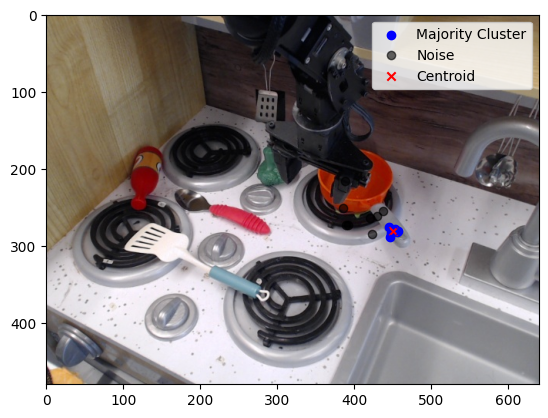

move the pot from the left to the right stove


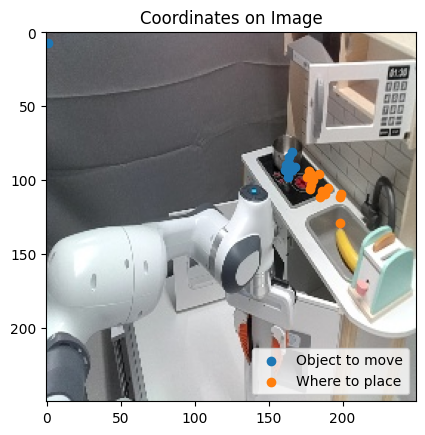

Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [164.14285714  90.71428571]
Diameter of majority cluster: 17.26267650163207


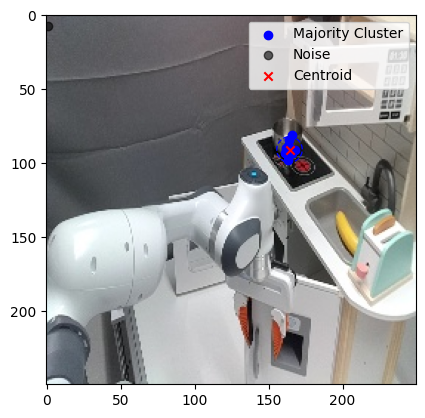

Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [185.06666667 104.8       ]
Diameter of majority cluster: 40.8166632639171


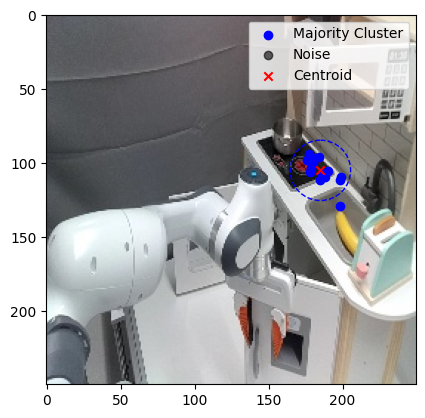

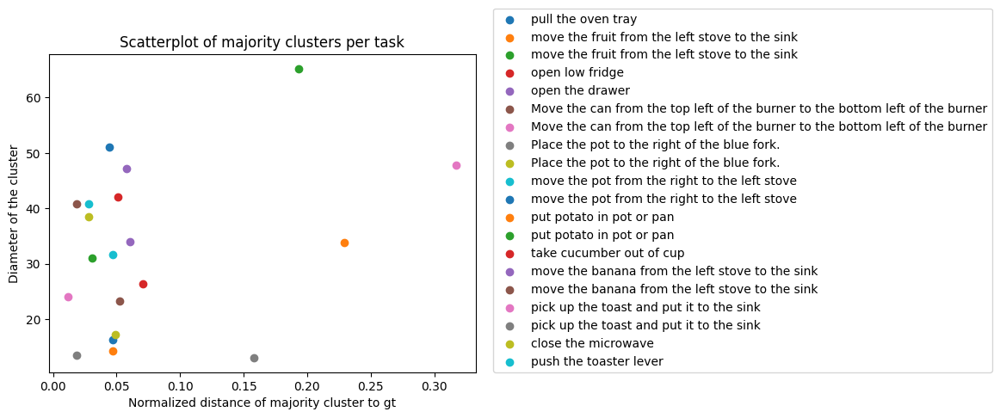

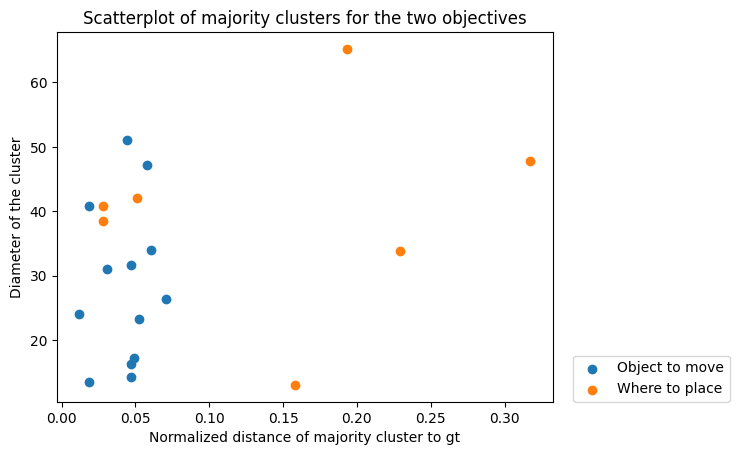

In [4]:
experiment_path = "../data/base_experiments"
num_runs = 15
temperature = 0.6

epsilon = 18
min_samples = 5

prompt_starts = ["You are the robot in the picture. Your mission it to guide and support the user in its task to: ", "You are the robot in the picture. Your mission it to guide and support the user in its task to: "]
prompt_ends = [" For that you have to point to the relevant object in the picture. Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the object to move. Dont output anything else.", " For that you have to point to the place in the picture where the object has to be moved to. Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the place where the object has to be moved to. Dont output anything else."]

run_experiment(experiment_path, prompt_starts, prompt_ends, num_runs, temperature, epsilon, min_samples)